# Super resolution with DIP

## Imports

In [1]:
import tensorflow as tf
import os

import matplotlib.pyplot as plt
import numpy as np
import cv2
%matplotlib inline

import copy

from skimage.metrics import peak_signal_noise_ratio

In [2]:
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only allocate 1GB of memory on the first GPU
    try:
        #tf.config.experimental.set_virtual_device_configuration(
        #gpus[0],
        #[tf.config.experimental.VirtualDeviceConfiguration(memory_limit=2024)])
        tf.config.experimental.set_memory_growth(gpus[0], True)
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Virtual devices must be set before GPUs have been initialized
        print(e)

1 Physical GPUs, 1 Logical GPUs


In [3]:
!nvidia-smi

Sun Mar 28 19:40:23 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.39       Driver Version: 460.39       CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  GeForce RTX 307...  Off  | 00000000:01:00.0 Off |                  N/A |
| N/A   59C    P0    26W /  N/A |    642MiB /  7982MiB |     15%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Create image

In [4]:
def load_image(fn, crop_div32=True):
    """
    Load image
    :param fn: file name of image
    :param crop_div32: boolean to crop center to have image size dividable by 32
    return: image with RGB, range 0-1, float32
    """
    if not os.path.isfile(fn):
        raise ValueError("No file {0}".format(fn))
    img = cv2.imread(fn)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # resize to have div32 size
    if crop_div32:

        new_size = (img.shape[0] - img.shape[0] % 32, 
                    img.shape[1] - img.shape[1] % 32)

        img = img[(img.shape[0] - new_size[0])//2:(img.shape[0] + new_size[0])//2,
                    (img.shape[1] - new_size[1])//2:(img.shape[1] + new_size[1])//2]

    return (img/255.).astype(np.float32)

In [5]:
def get_low_resolution_image(img_orig, factor=4):
    
    lr_size = (img_orig.shape[1] // factor, img_orig.shape[0] // factor)
    img_lr = cv2.resize(img_orig, dsize=lr_size, interpolation=cv2.INTER_AREA)
    return img_lr

In [6]:
def plot_images(im, figsize=(15,15), axis=False):
    nr = len(im)
    fig = plt.figure(figsize=figsize)
    for idx in range(nr):    
        plt.subplot(eval("1"+str(nr)+str(idx+1))); plt.axis('off') if axis==False else plt.axis('on'); plt.imshow(im[idx])
    plt.show()

In [7]:
def get_baseline_resized_images(img_lr, shape):
    shape = (shape[1], shape[0])
    img_bicubic = cv2.resize(img_lr, dsize=shape, interpolation=cv2.INTER_CUBIC).clip(0,1)
    img_nearest = cv2.resize(img_lr, dsize=shape, interpolation=cv2.INTER_NEAREST).clip(0,1)
    
    return img_bicubic, img_nearest

In [8]:
sigma = 25
sigma_ = sigma/255.

HR and LR resolutions: (384, 576, 3), (96, 144, 3)
original image:  (384, 576, 3) float32 0.0 1.0
low resolution image:  (96, 144, 3) float32 0.0 1.0


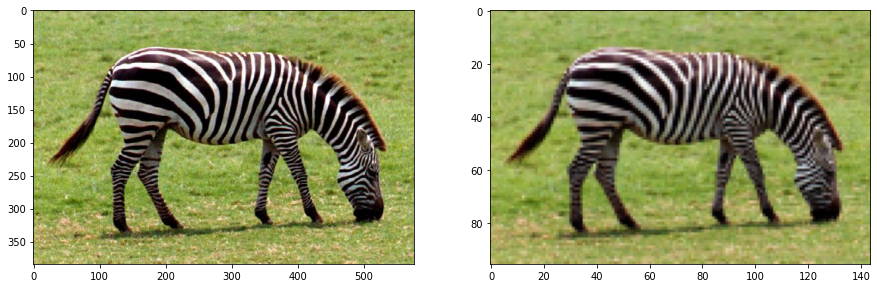

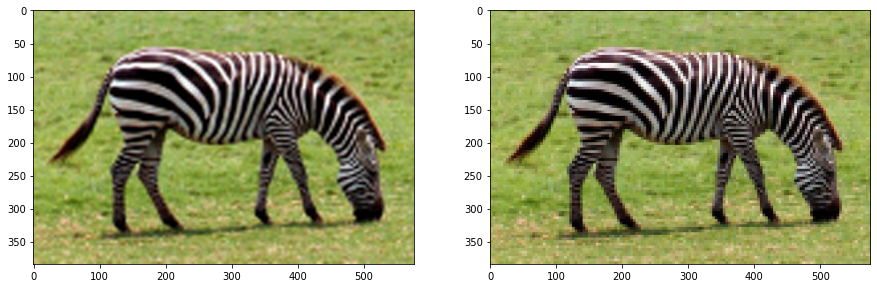

cubic:  (384, 576, 3) float32 0.0 1.0
nearest:  (384, 576, 3) float32 0.0 1.0


In [9]:
img_hr = load_image("../data/zebra_GT.png", True)
img_lr = get_low_resolution_image(img_hr, 4)
print('HR and LR resolutions: %s, %s' % (str(img_hr.shape), str (img_lr.shape)))
print("original image: ",np.shape(img_hr), img_hr.dtype, img_hr.min(), img_hr.max())
print("low resolution image: ",np.shape(img_lr), img_lr.dtype, img_lr.min(), img_lr.max())
plot_images([img_hr, img_lr], axis=True)

img_cubic, img_nearest = get_baseline_resized_images(img_lr, img_hr.shape)
#print("PSNR = ", peak_signal_noise_ratio(img_noise, img))
plot_images([img_cubic, img_nearest], axis=True)
print("cubic: ",np.shape(img_cubic), img_cubic.dtype, img_cubic.min(), img_cubic.max())
print("nearest: ",np.shape(img_nearest), img_nearest.dtype, img_nearest.min(), img_nearest.max())


## Model definition

In [10]:
num_input_channels=2 
num_output_channels=3
numbers_filters_down=[128,128,128,128, 128]
numbers_filters_up=[128,128,128,128, 128]
numbers_filters_skip=[4, 4, 4, 4, 4]
kernel_down=3 
kernel_up=3 
kernel_skip=1
need1x1_up = True
depth = len(numbers_filters_down) -1
pad = 'reflection'
need_sigmoid = True

In [11]:
class ReflectionPadding2D(tf.keras.layers.Layer):
    def __init__(self, padding=(1, 1), **kwargs):
        self.padding = tuple(padding)
        self.input_spec = [tf.keras.layers.InputSpec(ndim=4)]
        super(ReflectionPadding2D, self).__init__(**kwargs)

    def compute_output_shape(self, s):
        """ If you are using "channels_last" configuration"""
        return (s[0], s[1] + 2 * self.padding[0], s[2] + 2 * self.padding[1], s[3])

    def call(self, x, mask=None):
        w_pad,h_pad = self.padding
        return tf.pad(x, [[0,0], [h_pad,h_pad], [w_pad,w_pad], [0,0] ], 'REFLECT')

In [12]:
def convolutional_layer(x, filters, kernel_size, strides, 
                        pad='reflection', downsample_mode='stride'):
    # padding
    to_pad = (int((kernel_size - 1) / 2), int((kernel_size - 1) / 2))
    if pad == 'reflection':
        x = ReflectionPadding2D(to_pad)(x)
    
    # conv2D
    downsample_stride = strides
    if strides[0] != 1 and downsample_mode != 'stride':
        strides = (1,1)
    x = tf.keras.layers.Conv2D(filters=filters, kernel_size=kernel_size, strides=strides)(x)
    
    # downsampling
    if downsample_stride[0] != 1 and downsample_mode != 'stride':
        if downsample_mode == 'avg':
            x = tf.keras.layers.AveragePooling2D(pool_size=downsample_stride, 
                                                          strides=downsample_stride)(x)
        elif downsample_mode == 'max':
            x = tf.keras.layers.MaxPool2D(pool_size=downsample_stride, 
                                                    strides=downsample_stride)(x)
        else:
            raise ValueError("downsample_mode {0} not valid.".format(downsample_mode))
    return x

In [13]:
def convolutional_block(x, filters, kernel_size, strides, 
                        pad='reflection', downsample_mode='stride',
                        act='leaky_relu'):
    
    # padding + conv + downsampling
    x = convolutional_layer(x, filters, kernel_size, strides, pad, downsample_mode)
    # bn + activation
    x = tf.keras.layers.BatchNormalization(momentum=0.1, epsilon=1e-05)(x)
    if act == 'leaky_relu':
        x = tf.keras.layers.LeakyReLU(alpha=0.2) (x)
    return x

In [14]:
input_layer = tf.keras.Input(shape=(384,576,32), batch_size=1, name='input', dtype=None, sparse=False, tensor=None)
x = input_layer

skip_block = []

kd = kernel_down
ku = kernel_up
ks = kernel_skip

for idx, nd in enumerate(numbers_filters_down):
    
    # first conv block
    x = convolutional_block(x, filters=nd, kernel_size=3, strides=(2,2), 
                            pad='reflection', downsample_mode='stride',
                            act='leaky_relu')
    # second conv block
    x = convolutional_block(x, filters=nd, kernel_size=3, strides=(1,1), 
                            pad='reflection', downsample_mode='stride',
                            act='leaky_relu')
    
    # skip connection
    #print(x)
    skip = convolutional_block(x, filters=4, kernel_size=1, strides=(1,1), 
                        pad='reflection', downsample_mode='stride',
                        act='leaky_relu')
    skip_block.append(skip)
    
# bridge
x = skip_block.pop(-1)

for idx, nu in enumerate(reversed(numbers_filters_up[1:])):
    
    # first conv block
    x = tf.keras.layers.BatchNormalization(momentum=0.1, epsilon=1e-05)(x)
    x = convolutional_block(x, filters=nu, kernel_size=3, strides=(1,1), 
                            pad='reflection', downsample_mode='stride',
                            act='leaky_relu')
    # second conv block 1x1 convolution
    if need1x1_up:
        x = convolutional_block(x, filters=nu, kernel_size=1, strides=(1,1), 
                                pad='reflection', downsample_mode='stride',
                                act='leaky_relu')
    # upsample
    x = tf.keras.layers.UpSampling2D(size=2, interpolation='bilinear')(x)    
    up = x    
    
    #print("x", up)
    #print("skip", skip_block[depth-idx])
    
    # concatenate
    x = tf.keras.layers.concatenate([skip_block[depth-1-idx], x], axis=3)

# last step in up filters
x = tf.keras.layers.BatchNormalization(momentum=0.1, epsilon=1e-05)(x)
x = convolutional_block(x, filters=numbers_filters_up[0], kernel_size=3, strides=(1,1), 
                        pad='reflection', downsample_mode='stride',
                        act='leaky_relu')
# second conv block 1x1 convolution
if need1x1_up:
    x = convolutional_block(x, filters=numbers_filters_up[0], kernel_size=1, strides=(1,1), 
                            pad='reflection', downsample_mode='stride',
                            act='leaky_relu')
    
# last upsample
x = tf.keras.layers.UpSampling2D(size=2, interpolation='bilinear')(x)    
    
    
# last conv layer -> filter = 3
x = convolutional_layer(x, filters=3, kernel_size=3, strides=(1,1), 
                        pad='reflection', downsample_mode='stride')
# sigmoid activation
if need_sigmoid:
    x = tf.keras.activations.sigmoid(x)

In [15]:
model = tf.keras.Model(inputs=input_layer, outputs=x)
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input (InputLayer)              [(1, 384, 576, 32)]  0                                            
__________________________________________________________________________________________________
reflection_padding2d (Reflectio (1, 386, 578, 32)    0           input[0][0]                      
__________________________________________________________________________________________________
conv2d (Conv2D)                 (1, 192, 288, 128)   36992       reflection_padding2d[0][0]       
__________________________________________________________________________________________________
batch_normalization (BatchNorma (1, 192, 288, 128)   512         conv2d[0][0]                     
______________________________________________________________________________________________

# Prepare input

In [16]:
def get_net_input(shape, var=1./10):
    shape = (1,shape[0], shape[1],32)
    net_input = tf.random.normal(shape)
    net_input *= var
    return net_input

In [17]:
net_input = get_net_input(img_hr.shape)
print("net input: ", net_input.shape, net_input.dtype, np.min(net_input), np.max(net_input))

net input:  (1, 384, 576, 32) <dtype: 'float32'> -0.56018126 0.5490355


noisy tf image:  (1, 96, 144, 3) <dtype: 'float32'> 0.0 1.0


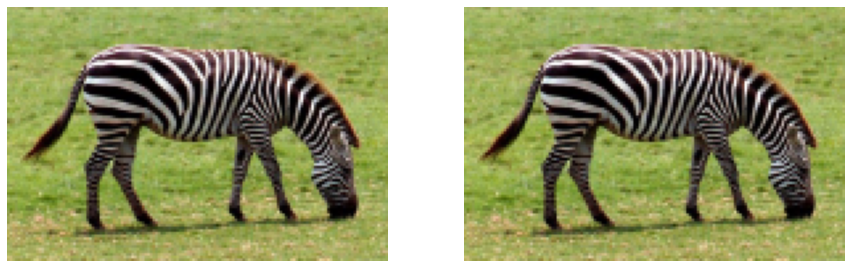

In [18]:
img_lr_tf = tf.convert_to_tensor(img_lr.reshape(1,*img_lr.shape))
print("noisy tf image: ", img_lr_tf.shape, img_lr_tf.dtype, np.min(img_lr_tf), np.max(img_lr_tf))
plot_images([img_lr, img_lr_tf[0]])

# Setup training

In [19]:
learning_rate = 0.01
num_iter = 2000
reg_noise_std = 0.03
exp_weight=0.99

In [20]:
# optimizer and loss
adam = tf.keras.optimizers.Adam(learning_rate=learning_rate, beta_1=0.9, beta_2=0.999, 
                                     epsilon=1e-08, amsgrad=False,name='Adam')

mse = tf.keras.losses.MeanSquaredError(reduction=tf.keras.losses.Reduction.AUTO)

In [21]:
shape_hw = (96,144)
print("shape net_input & img lr: ", net_input.shape, img_lr_tf.shape)
print("shape model output & resized model output: ", model(net_input).shape, tf.image.resize(model(net_input), shape_hw, method="lanczos3").shape)

shape net_input & img lr:  (1, 384, 576, 32) (1, 96, 144, 3)
shape model output & resized model output:  (1, 384, 576, 3) (1, 96, 144, 3)


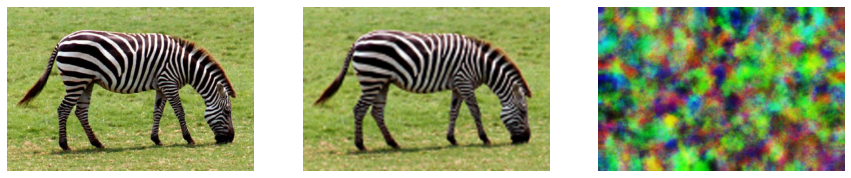

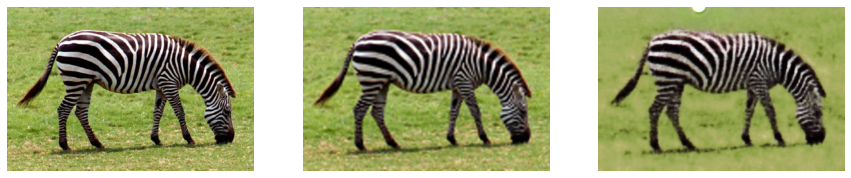

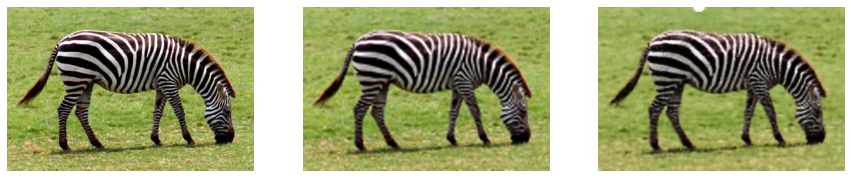

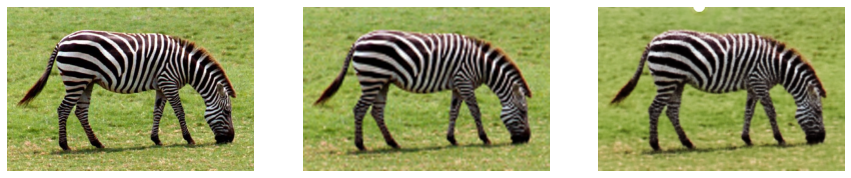

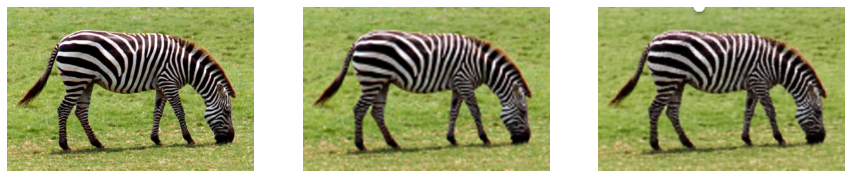

...

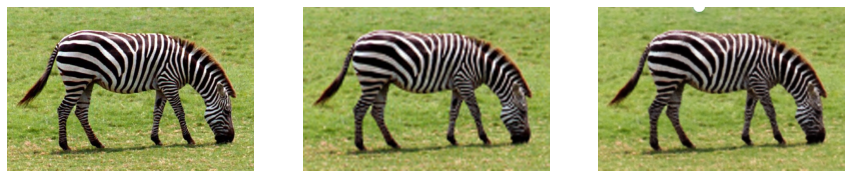

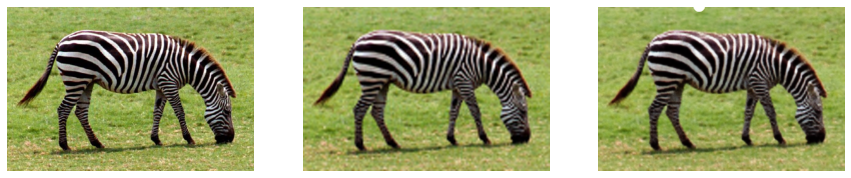

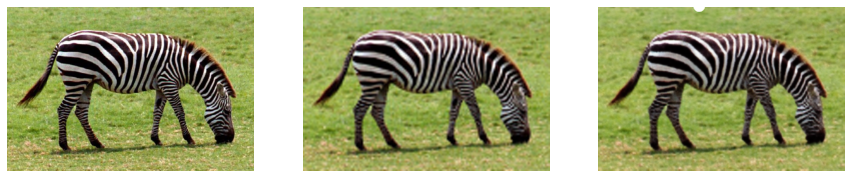

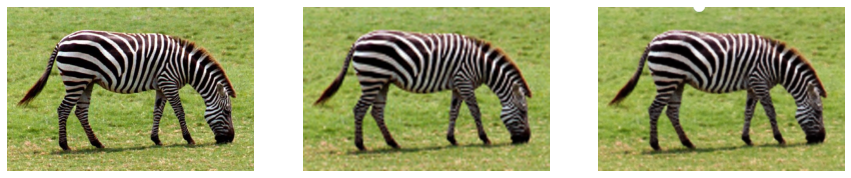

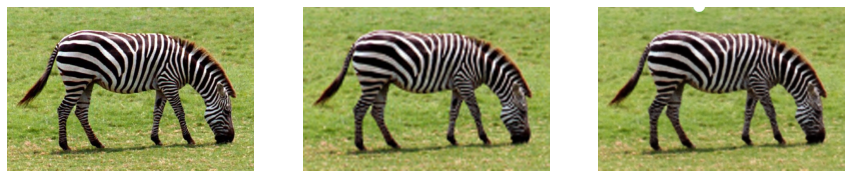

In [22]:
net_input_saved = copy.deepcopy(net_input)
noise = copy.deepcopy(net_input)
output_avg = None
shape_hw = (96,144)
shape = [1,384,576,32]
for epoch in range(num_iter):    
    if reg_noise_std > 0: # add again noise to input image
        net_input = net_input_saved + (tf.random.normal(shape) * reg_noise_std)
    
    # Open a GradientTape to record the operations run
    # during the forward pass, which enables auto-differentiation.
    with tf.GradientTape() as tape:

        # Run the forward pass of the layer.
        # The operations that the layer applies
        # to its inputs are going to be recorded
        # on the GradientTape.
        output = model(net_input, training=True)  # Logits for this minibatch
        
        # downsample input image
        output_lr = tf.image.resize(output, shape_hw, method="lanczos3")

        # Compute the loss value for this minibatch.
        loss_value = mse(output_lr, img_lr_tf)
    
    # TODO: add total loss weight with TV_weight
        
    # compare psnr
    output_np = tf.make_ndarray(tf.make_tensor_proto(output))[0]
    output_lr_np = tf.make_ndarray(tf.make_tensor_proto(output_lr))[0]
    psrn_hr = peak_signal_noise_ratio(img_hr, output_np)
    psrn_lr = peak_signal_noise_ratio(img_lr, output_lr_np)
    
    
    print ('Iteration %05d    PSNR_LR %.3f   PSNR_HR %.3f' % (epoch, psrn_lr, psrn_hr), '\r', end='')
    if  True and epoch % 100 == 0:
        plot_images([img_hr, img_cubic, output_np])
        
    # Use the gradient tape to automatically retrieve
    # the gradients of the trainable variables with respect to the loss.
    grads = tape.gradient(loss_value, model.trainable_weights)

    # Run one step of gradient descent by updating
    # the value of the variables to minimize the loss.
    adam.apply_gradients(zip(grads, model.trainable_weights))

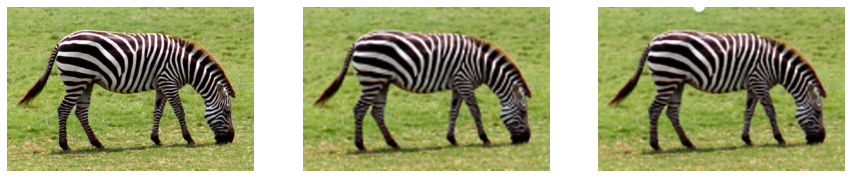

PSNR =  23.28847746435529


In [23]:
out_np = model(net_input).numpy()[0]
plot_images([img_hr, img_cubic, out_np])
print("PSNR = ", peak_signal_noise_ratio(img_hr, output_np))

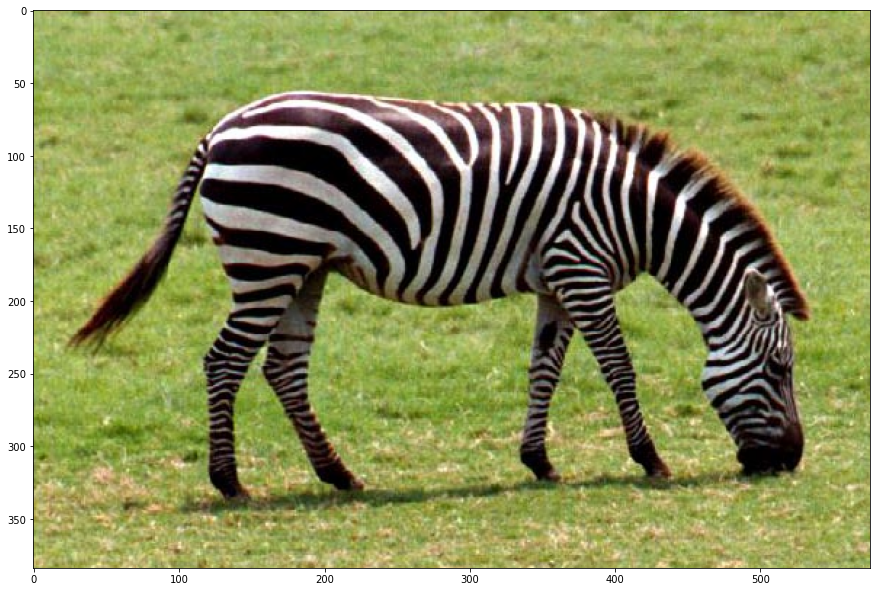

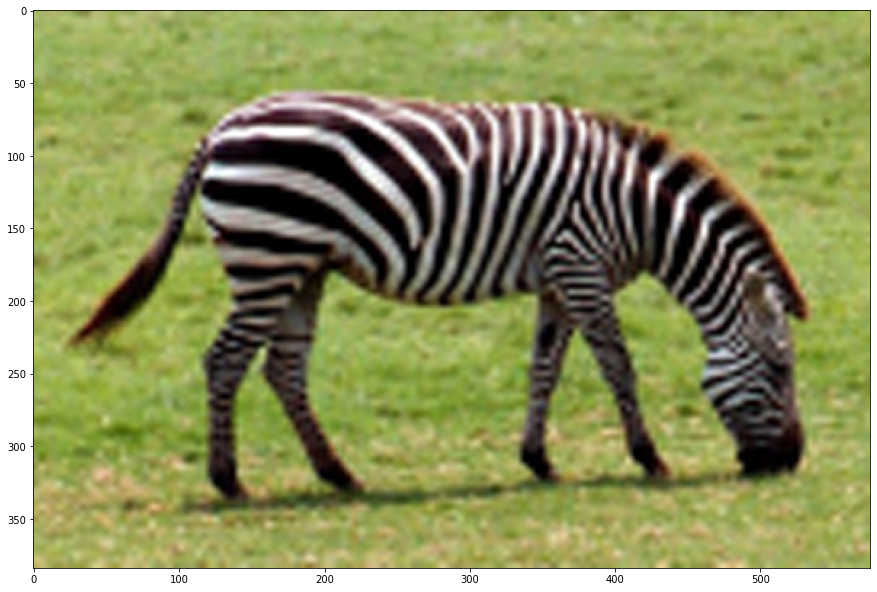

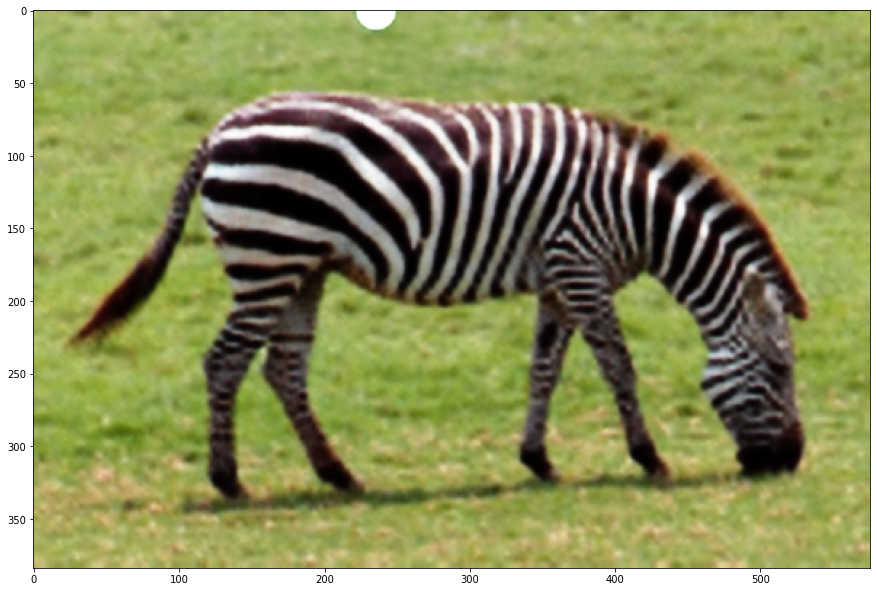

In [24]:
fig = plt.figure(figsize=(15,15))
plt.imshow(img_hr)
plt.show()
fig = plt.figure(figsize=(15,15))
plt.imshow(img_cubic)
plt.show()
fig = plt.figure(figsize=(15,15))
plt.imshow(output_np)
plt.show()

In [25]:
print("PSNR cubic = ",peak_signal_noise_ratio(img_hr, img_cubic))
print("PSNR nearest = ", peak_signal_noise_ratio(img_hr, img_nearest))

PSNR cubic =  23.121963112984115
PSNR nearest =  21.009971479170666
